### Initialization Bock

In [1]:
#!pip install tensorflow==1.12.0

In [2]:
# Initialization
colab_run=False
anc_box= False
_grid_offset=True
train=False
test_mode=1
data_save=True
root='D:/'
train_dir='COCO/train2017/train2017/'
val_dir='COCO/val2017/val2017/'
test_dir='COCO/test2017/test2017/'
if colab_run==True:
  !pip install pydrive
  from pydrive.auth import GoogleAuth
  from pydrive.drive import GoogleDrive
  from google.colab import auth
  from oauth2client.client import GoogleCredentials

  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)

  import os, cv2
  from google.colab import drive
  drive.mount('/content/drive/')

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from matplotlib import pyplot as plt
import tensorflow.keras.backend as K
import tensorflow as tf
import numpy as np
import pickle
import os, cv2

#os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

# %matplotlib inline


C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\irfan\Anaconda3\envs\tf\lib\site-packages\tensorflow\python\framework\dty

### Configure Block

### Model Building Block

In [3]:
LABELS=['person', 'bird', 'cat', 'cow', 'dog', 'horse', 'sheep','aeroplane', 'bicycle',
         'boat', 'bus', 'car', 'motorbike', 'train', 'bottle', 'chair','diningtable',
         'pottedplant', 'sofa', 'tvmonitor']
f=open('coco.txt','r')
LABELS=[]
for line in f:
    line=line.split(':')
    LABELS.append(str(line[1][1:-1]))
f=open('D:/COCO/_labels_coco_road','rb')
_LABELS=pickle.load(f)
f.close()
LABELS=list(_LABELS.values())

IMAGE_H, IMAGE_W = 416, 416
GRID_H,  GRID_W  = 13 , 13
BOX              = 5
CLASS            = len(LABELS)
CLASS_WEIGHTS    = np.ones(CLASS, dtype='float32')
OBJ_THRESHOLD    = 0.3#0.5
NMS_THRESHOLD    = 0.3#0.45
ANCHORS          = [0.57273, 0.677385, 1.87446, 2.06253, 3.33843, 5.47434, 7.88282, 3.52778, 9.77052, 9.16828]
#ANCHORS          = [1.3221, 1.73145, 3.19275, 4.00944, 5.05587, 8.09892, 9.47112, 4.84053, 11.2364, 10.0071]           
#ANCHORS          = [ 4.469053,2.148582,10.548851,5.381520,11.420664,9.961033,6.517299,3.699693,2.469196,1.599054]

BATCH_SIZE       = 10
WARM_UP_BATCHES  = 0
TRUE_BOX_BUFFER  = 50
lambda_coord=5.0
lambda_noobj=0.5

lr=1e-4
epochs=20
optimizer = Adam(lr=lr)#, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
#optimizer = SGD(lr=1e-4, decay=0.0005, momentum=0.9)
#optimizer = RMSprop(lr=lr)#, rh=0.9, epsilon=1e-08, decay=0.0)
exp_name='v-2.2_road_mod/'
root='D:/'
path_wts=root+'yolov2.weights'
path_wts_final=root+exp_name+'best.hdf5'
if not os.path.exists(root+exp_name):
    os.mkdir(root+exp_name)

In [4]:
from yolo import *

SyntaxError: duplicate argument 'IMAGE_W' in function definition (yolo.py, line 2)

### Data Ready Block

### Reading Data

In [6]:
import glob
import cv2
import pandas as pd
import pickle

f=open(root+'COCO/train_coco_dfs_road','rb')
train_data=pickle.load(f)
f.close()
f=open(root+'COCO/val_coco_dfs_road','rb')
valid_data=pickle.load(f)
f.close()
f=open(root+'COCO/test_coco_dfs','rb')
test_data=pickle.load(f)
f.close()

In [7]:
if train==True or train==False: 
  #train_imgs=all_data[:n_train]
  N=len(train_data)
  n_train=len(train_data)
  n_valid=len(valid_data)
  train_batch=[]
  valid_batch=[]
  no_of_tr_batch=int(np.floor(n_train/BATCH_SIZE))
  train_batch=Batch_Gen(train_data,no_of_tr_batch,train_dir)
  no_of_val_batch=int(np.floor(n_valid/BATCH_SIZE))
  valid_batch=Batch_Gen(valid_data,no_of_val_batch,val_dir)

In [8]:
name=[]
class_wt=pd.Series([0]*len(LABELS),index=LABELS)
for sample in train_data:  
    names=[obj['name'] for obj in sample['object']] 
    for label in names:
        class_wt[label]+=1
class_weights=class_wt.sum()-class_wt#.values
class_weights=class_weights/class_weights.max()
CLASS_WEIGHTS=np.array(class_weights.values,dtype=np.float32)
CLASS_WEIGHTS

array([0.3018619, 0.9861258, 0.8863649, 0.9817555, 0.991396 , 0.9888471,
       0.9929248, 0.9781563, 0.976499 , 0.9703017, 1.       ],
      dtype=float32)

In [3]:
yolo_obj=yolo(IMAGE_W=IMAGE_W,IMAGE_H=IMAGE_H,GRID_W=GRID_W,GRID_W,CLASS=CLASS,BOX=BOX,CCLASS_WEIGHTS=CLASS_WEIGHTS,anc_box=anc_box)

NameError: name 'IMAGE_W' is not defined

000000000139.jpg
person 000000000139.jpg
person 000000000139.jpg


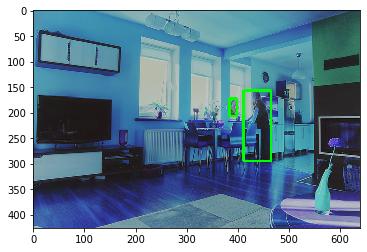

000000000724.jpg
stop sign 000000000724.jpg
truck 000000000724.jpg
car 000000000724.jpg
stop sign 000000000724.jpg


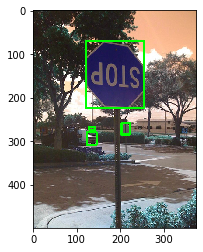

000000000785.jpg
person 000000000785.jpg


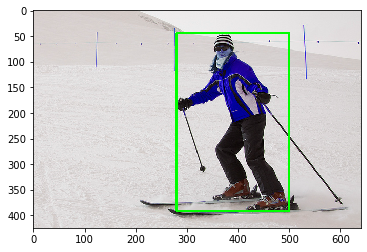

000000000872.jpg
person 000000000872.jpg
person 000000000872.jpg


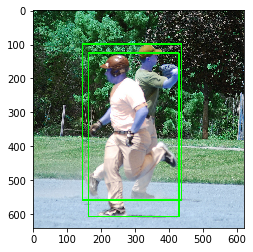

000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg
person 000000000885.jpg


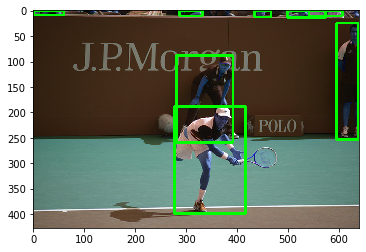

000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg
person 000000001000.jpg


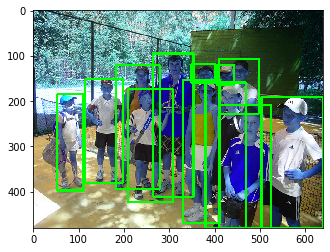

000000001268.jpg
boat 000000001268.jpg
boat 000000001268.jpg
person 000000001268.jpg
person 000000001268.jpg
person 000000001268.jpg
person 000000001268.jpg
boat 000000001268.jpg


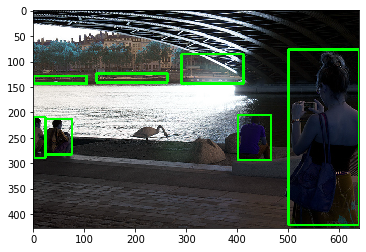

000000001296.jpg
person 000000001296.jpg
person 000000001296.jpg


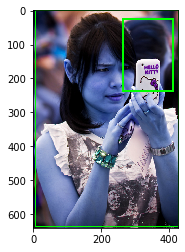

000000001353.jpg
train 000000001353.jpg
person 000000001353.jpg
person 000000001353.jpg
person 000000001353.jpg
person 000000001353.jpg
person 000000001353.jpg
person 000000001353.jpg


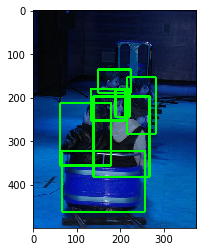

000000001490.jpg
person 000000001490.jpg


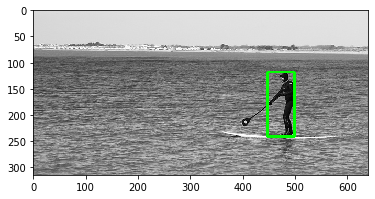

In [9]:
for i in range(0,10):
    image_h=(valid_data[i]['height'])
    image_w=(valid_data[i]['width'])
    print(valid_data[i]['filename'])
    img=cv2.imread(root+val_dir+valid_data[i]['filename'])
    for obj in valid_data[i]['object']:
        print(obj['name'],valid_data[i]['filename'])
        xmin,ymin,xmax,ymax=list(obj.values())[1:]
        cv2.rectangle(img, (int(xmin*image_w),int(ymin*image_h)), (int(xmax*image_w),int(ymax*image_h)), (0,255,0), 3)
    plt.imshow(img)
    plt.show()

In [10]:
image_h=(test_data[i]['height']/416)
test_data[i]['height']/416

1.1538461538461537

data_check=True
if data_check==True:
    sampleX,sampleY=next(train_batch)
    plt.imshow(sampleX[3])
    plt.show()
    img=sampleY[3][...,3,11+5]
    plt.imshow(img)
    plt.show()
    for i in range(4,5):
        print('index',i)
        plt.imshow(sampleY[3][...,3,i]*10)
        plt.show()

### Train Block

In [11]:
model=build_model()
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 416, 416, 3)  0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 416, 416, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 416, 416, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 416, 416, 32) 0           norm_1[0][0]                     
__________________________________________________________________________________________________
max_poolin

In [12]:
for layer in model.layers[-16:]:
        print(layer)

In [13]:


def train_model(model):
  #filepath="D:/"+exp_name+"weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5"
  filepath=root+exp_name+"best.hdf5"
  checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
  callbacks_list = [checkpoint]
  model.compile(loss=yolo_loss_1, optimizer=optimizer,metrics=['accuracy'])
  if anc_box==True:
    model.compile(loss=yolo_loss_1, optimizer=optimizer,metrics=['accuracy'])
  history=model.fit_generator(train_batch,
                              steps_per_epoch=no_of_tr_batch,
                              epochs=epochs,
                              callbacks=callbacks_list,
                              validation_data=valid_batch,
                              validation_steps=no_of_val_batch)

  
  return model,history


In [14]:
if train==True:
    model=load_weights(model,path_wts)
    #for layer in model.layers[:-31]:
    #    layer.trainable=False
    model,history=train_model(model)
    
    
    plt.plot(history.history['acc'])
    plt.plot(history.history['loss'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    
    # summarize history for loss
    plt.plot(range(5,epochs),history.history['loss'][5:])
    plt.plot(range(5,epochs),history.history['val_loss'][5:])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='upper left')
    plt.savefig(root+exp_name+'yolo-v1_exp.png')
    plt.show()
    

    f=open(root+exp_name+'history:_ep_70_v-1.0_exp','wb')
    pickle.dump([history.history['loss'],history.history['val_loss']],f)
    f.close()
    val_loss=np.array(history.history['val_loss'])
    best_epoch=np.argmin(val_loss) 
    print(best_epoch,val_loss[best_epoch])
if test_mode==1:
    model.load_weights(path_wts_final)
if test_mode==2:
    model=load_weights(model,path_wts)

### Predicion Block

In [16]:
import json
import pickle
test_on_val =True
test_on_test=False
test_server= False
calc_map=True

  0%|▏                                                                                | 2/1000 [00:02<25:12,  1.52s/it]

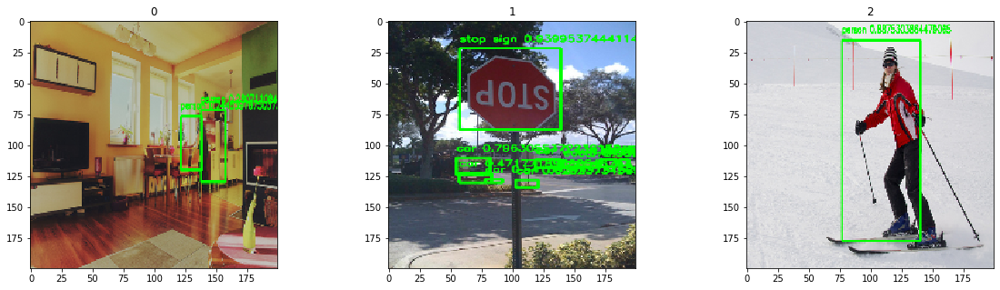

  0%|▍                                                                                | 5/1000 [00:03<14:42,  1.13it/s]

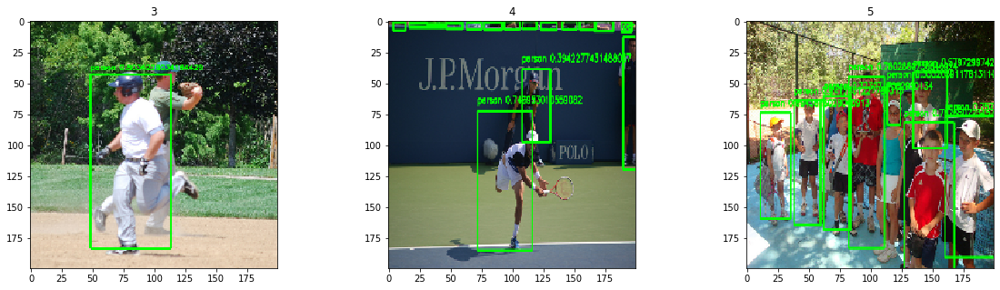

  1%|▌                                                                                | 7/1000 [00:03<10:05,  1.64it/s]

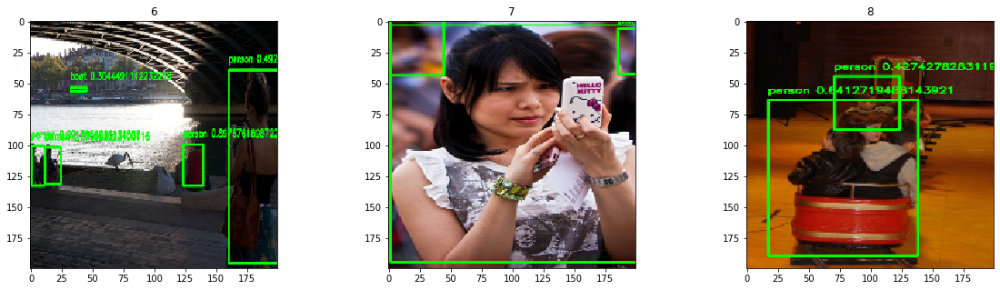

  1%|▉                                                                               | 11/1000 [00:04<06:21,  2.59it/s]

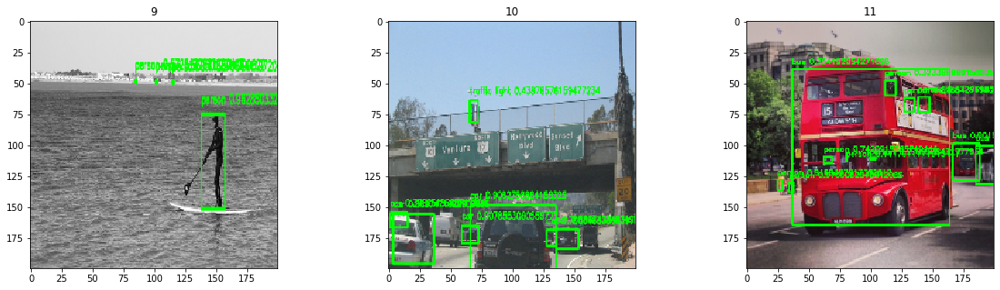

  1%|█                                                                               | 14/1000 [00:05<05:06,  3.22it/s]

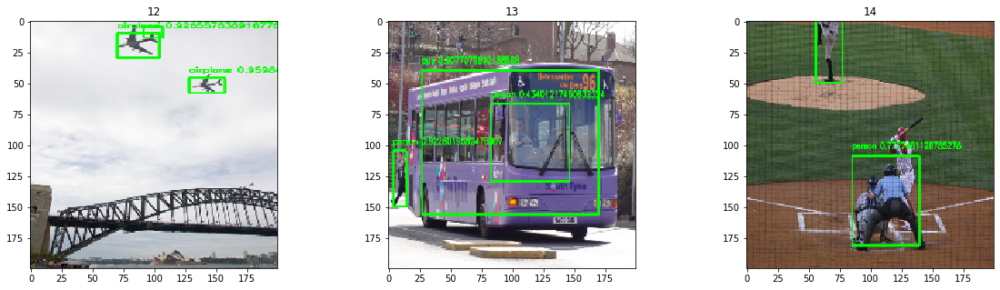

  2%|█▎                                                                              | 17/1000 [00:07<07:55,  2.07it/s]

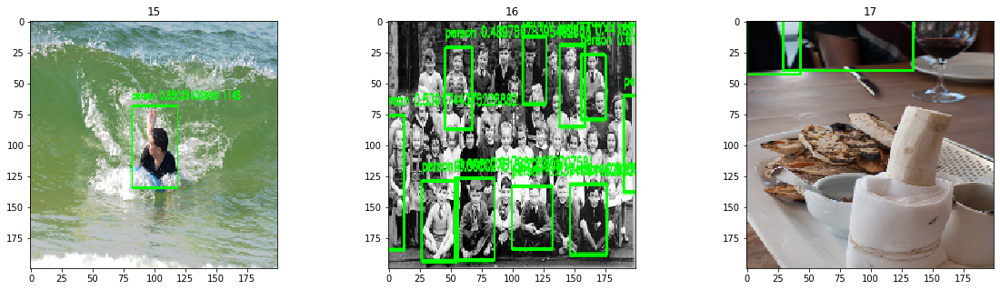

  2%|█▌                                                                              | 20/1000 [00:07<05:33,  2.94it/s]

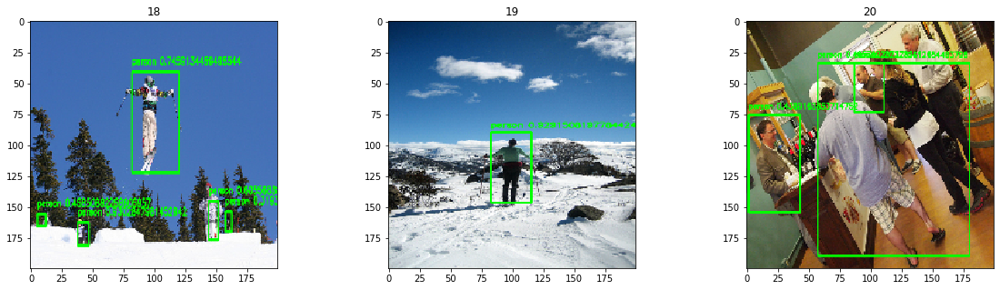

  2%|█▊                                                                              | 22/1000 [00:08<05:23,  3.02it/s]

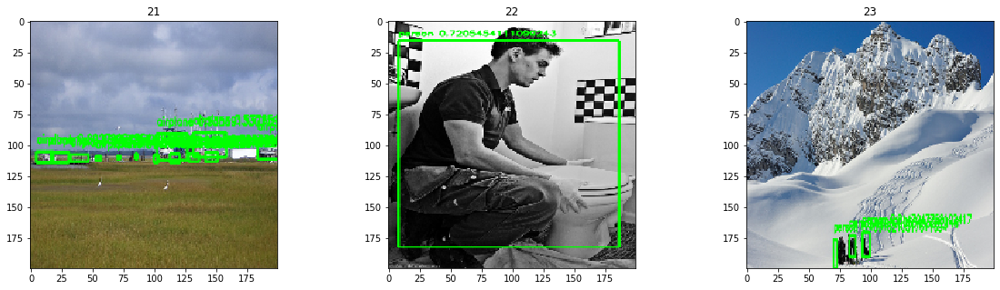

  3%|██                                                                              | 26/1000 [00:09<04:05,  3.96it/s]

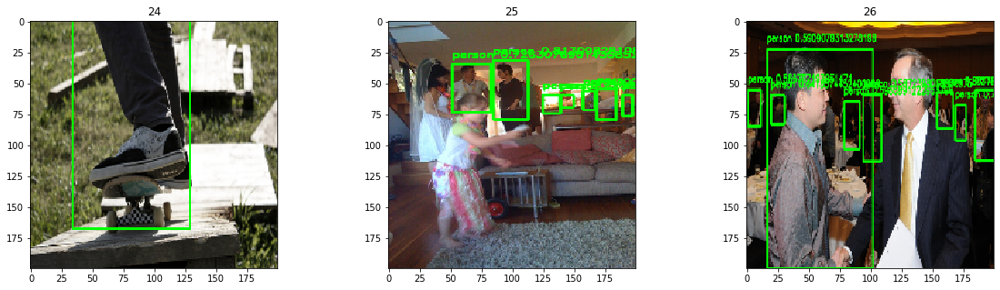

  3%|██▎                                                                             | 29/1000 [00:09<04:29,  3.60it/s]

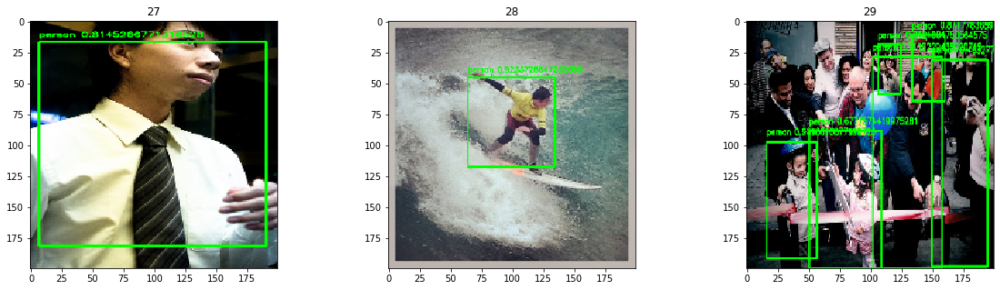

  3%|██▍                                                                             | 31/1000 [00:10<05:15,  3.07it/s]

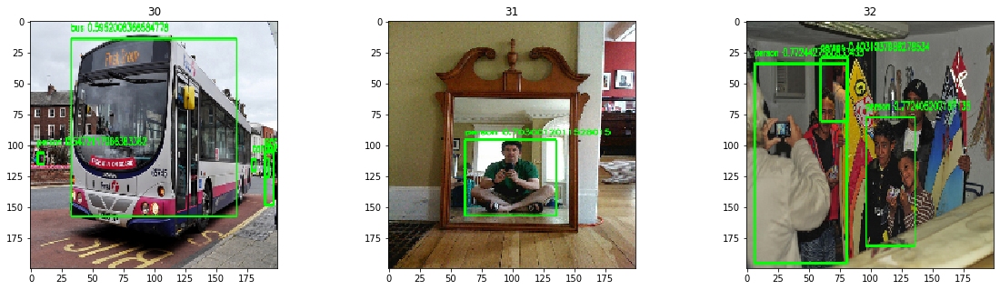

  4%|██▊                                                                             | 35/1000 [00:11<03:43,  4.32it/s]

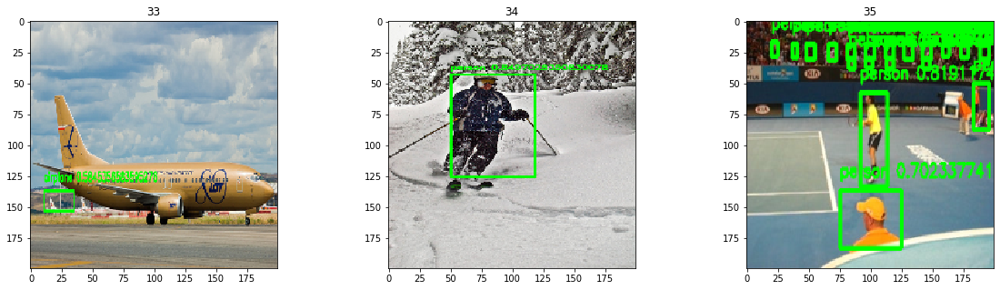

  4%|███                                                                             | 38/1000 [00:12<04:40,  3.43it/s]

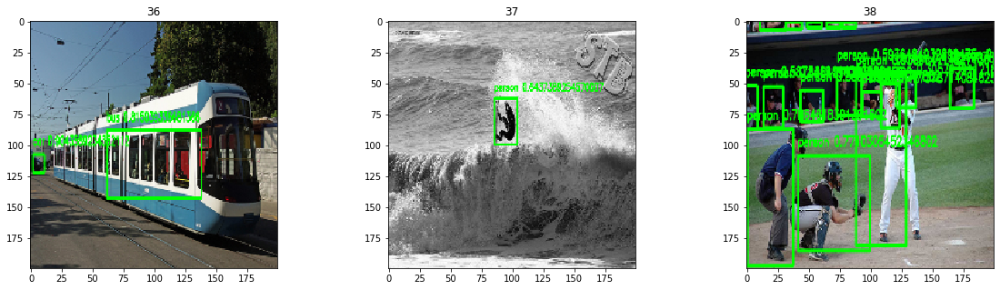

  4%|███▏                                                                            | 40/1000 [00:13<05:43,  2.79it/s]

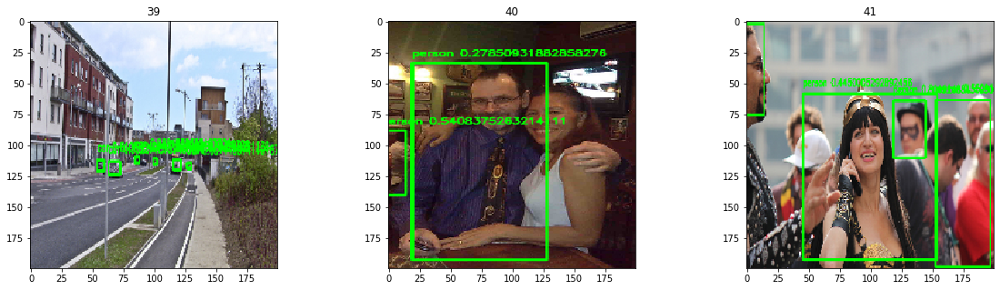

  4%|███▌                                                                            | 44/1000 [00:14<04:10,  3.82it/s]

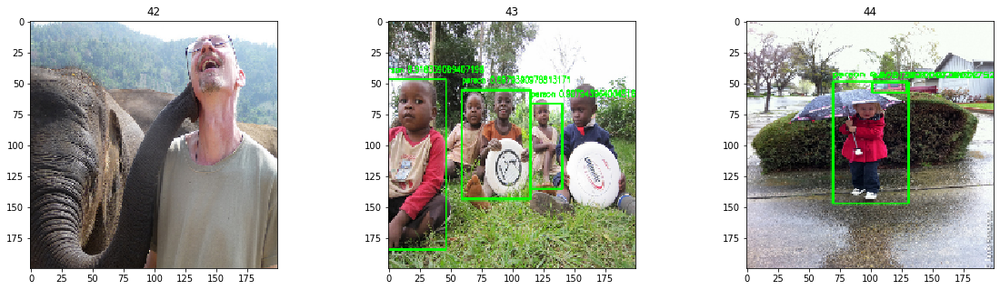

  5%|███▊                                                                            | 47/1000 [00:14<03:59,  3.97it/s]

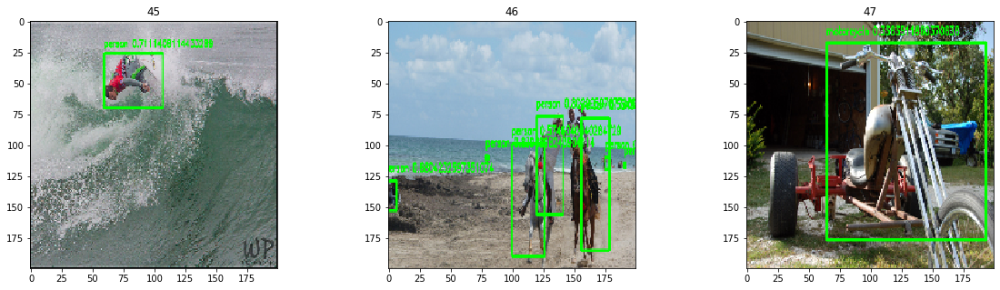

  5%|████                                                                            | 50/1000 [00:15<03:48,  4.16it/s]

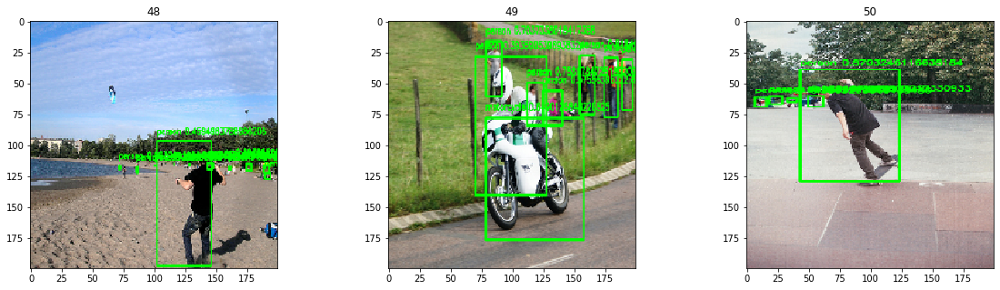

  5%|████▏                                                                           | 53/1000 [00:16<03:43,  4.24it/s]

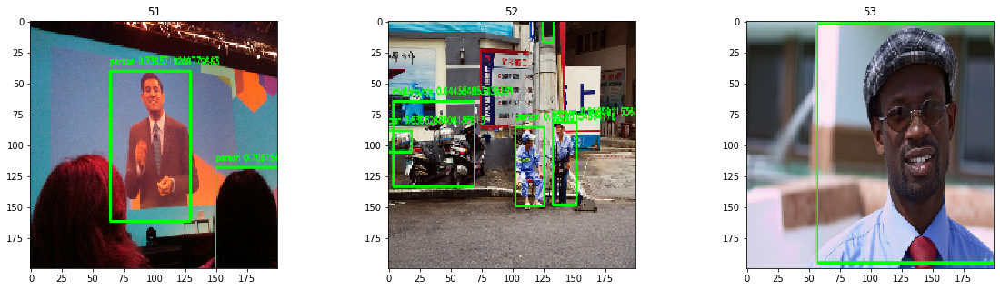

  6%|████▍                                                                           | 55/1000 [00:16<03:43,  4.24it/s]

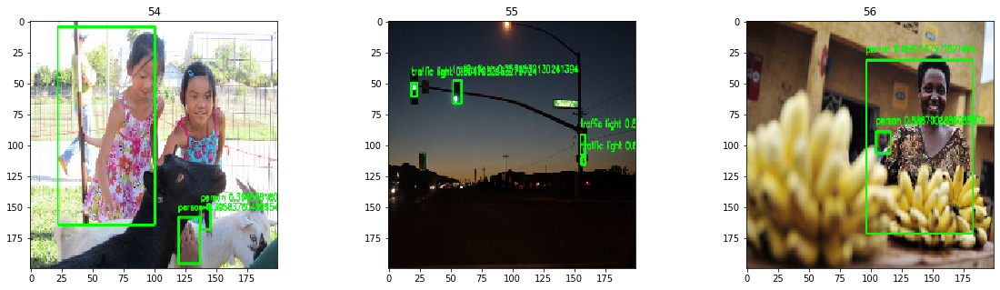

  6%|████▋                                                                           | 59/1000 [00:17<03:14,  4.85it/s]

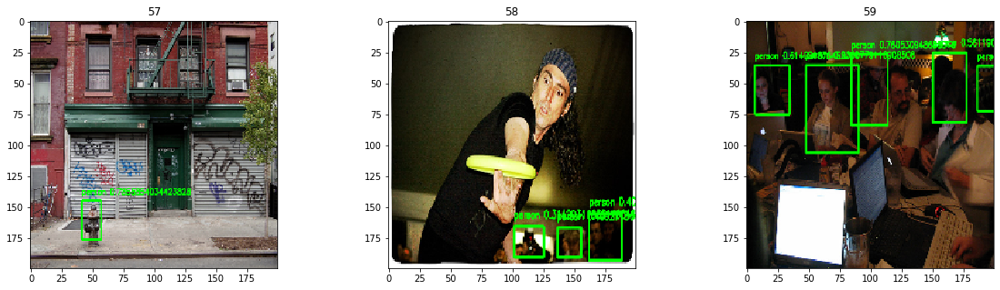

  6%|████▉                                                                           | 62/1000 [00:18<03:50,  4.07it/s]

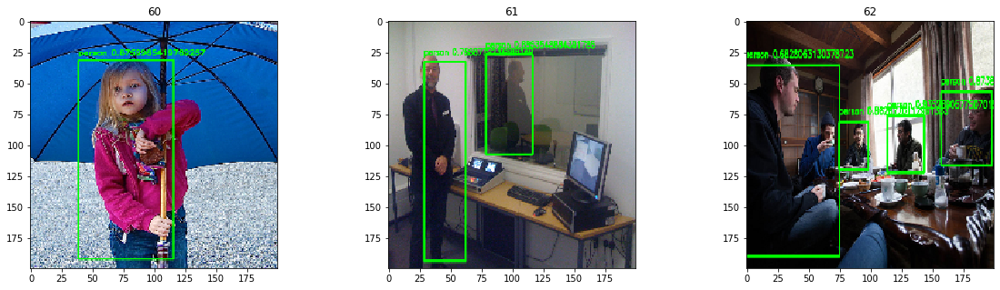

  6%|█████                                                                           | 64/1000 [00:18<03:49,  4.09it/s]

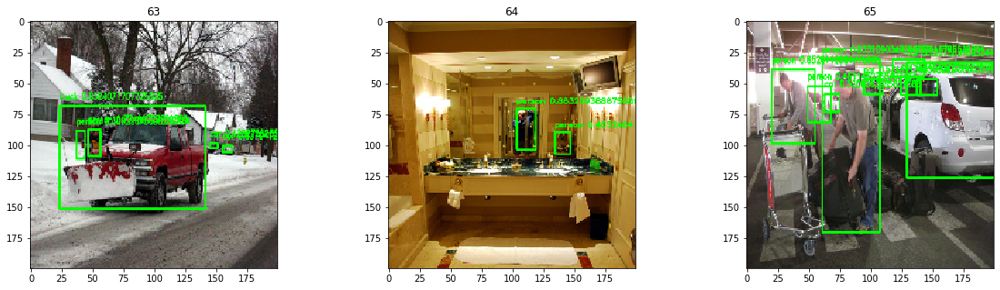

  7%|█████▍                                                                          | 68/1000 [00:19<03:08,  4.95it/s]

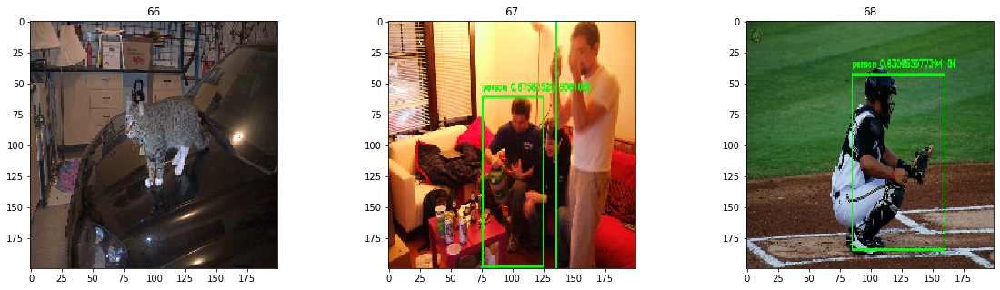

  7%|█████▋                                                                          | 71/1000 [00:19<03:10,  4.89it/s]

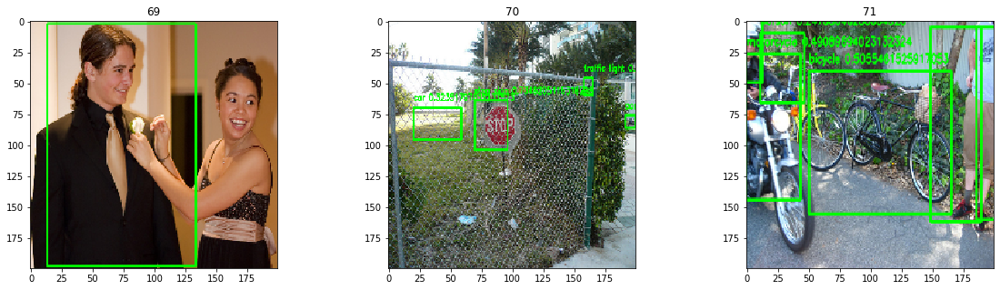

  7%|█████▉                                                                          | 74/1000 [00:20<03:42,  4.16it/s]

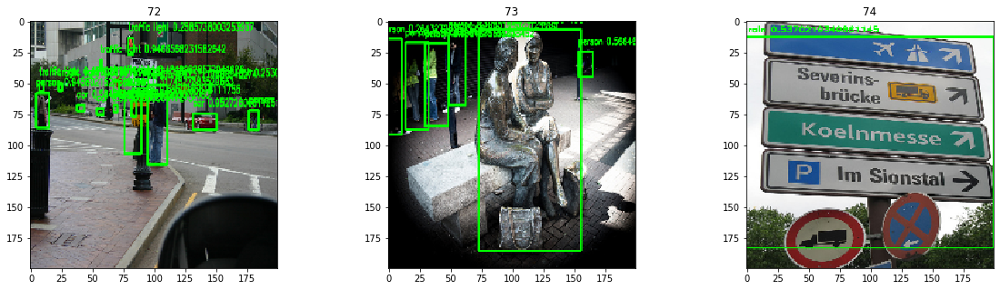

  8%|██████▏                                                                         | 77/1000 [00:21<04:14,  3.62it/s]

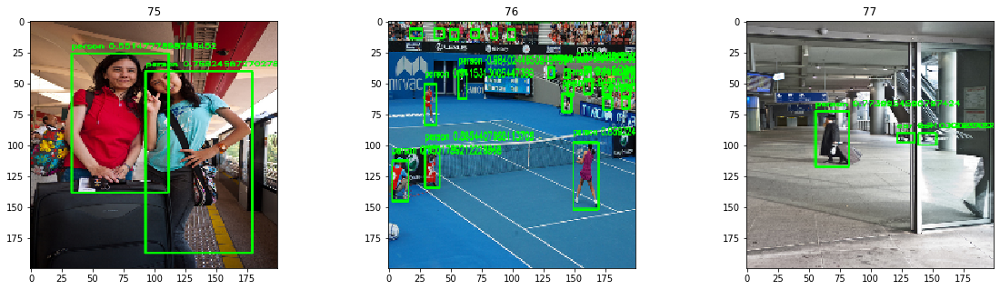

  8%|██████▍                                                                         | 80/1000 [00:22<04:19,  3.54it/s]

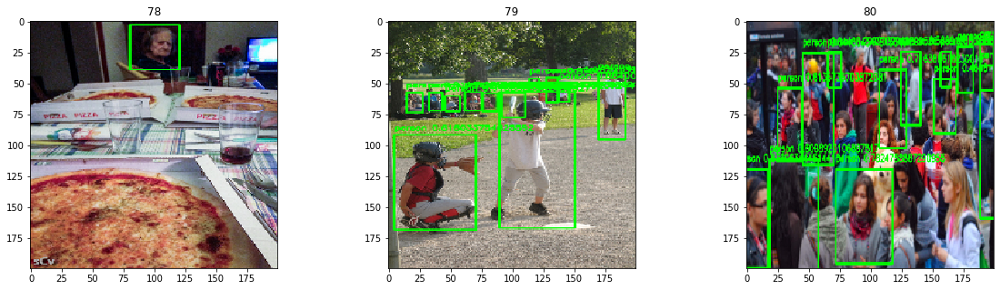

  8%|██████▋                                                                         | 83/1000 [00:24<07:19,  2.09it/s]

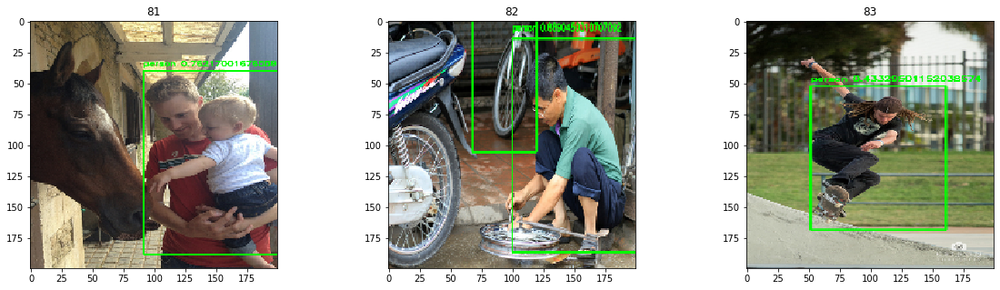

  9%|██████▉                                                                         | 86/1000 [00:24<04:27,  3.42it/s]

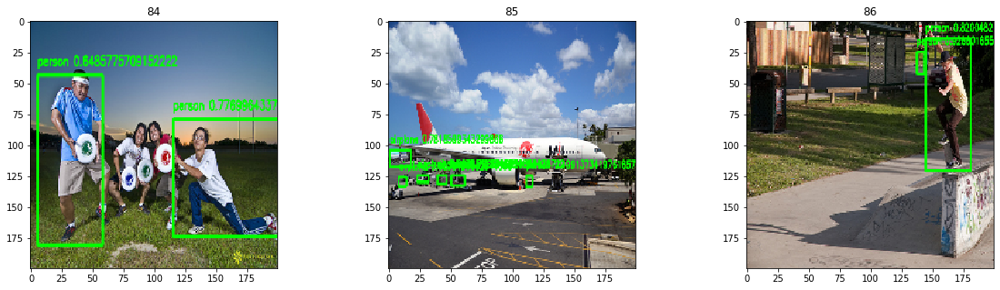

  9%|███████                                                                         | 88/1000 [00:25<04:01,  3.77it/s]

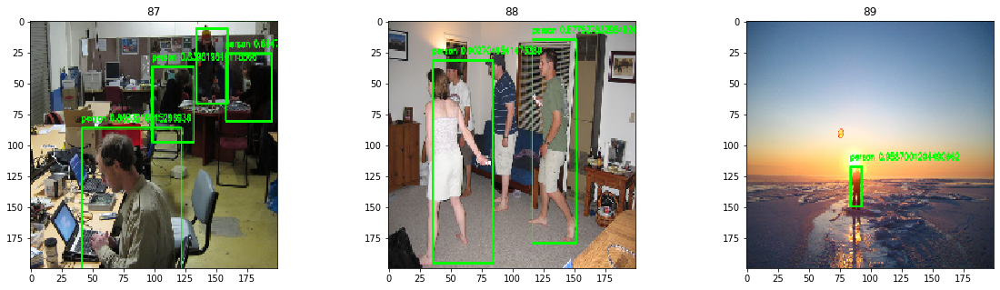

  9%|███████▎                                                                        | 92/1000 [00:26<03:01,  5.00it/s]

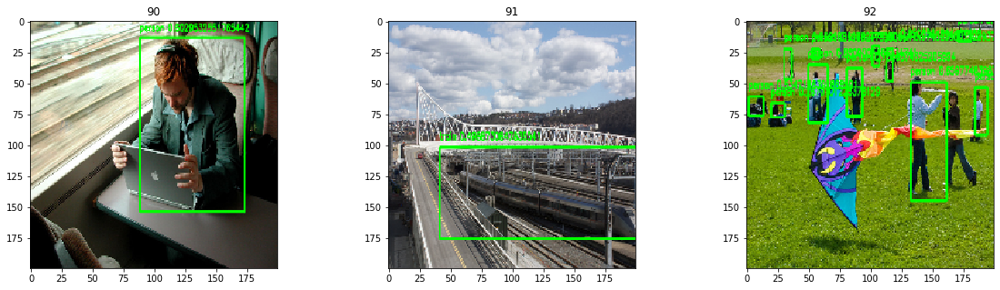

  9%|███████▌                                                                        | 94/1000 [00:26<04:13,  3.58it/s]

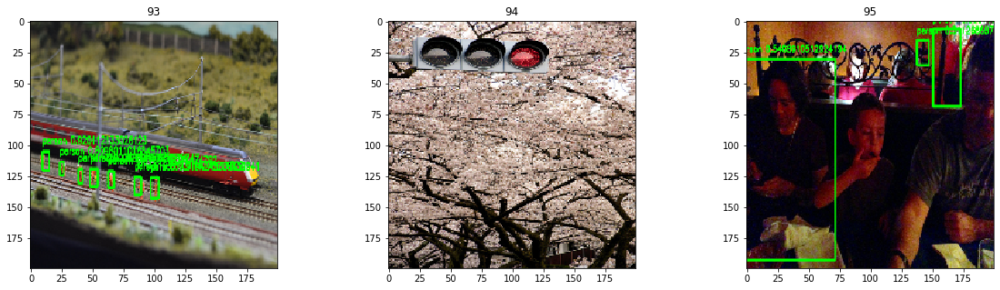

 10%|███████▊                                                                        | 98/1000 [00:27<03:10,  4.74it/s]

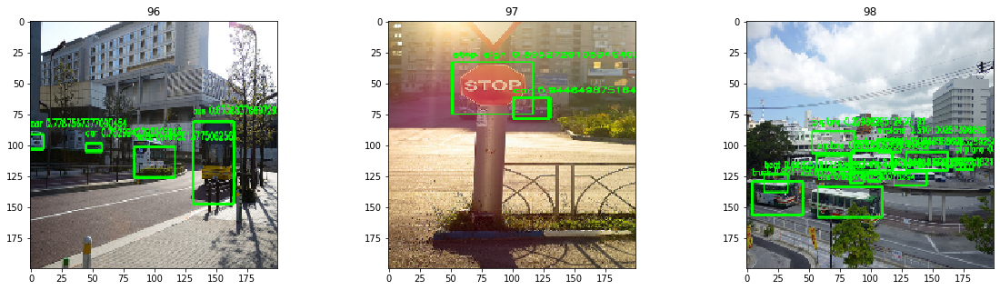

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:12<00:00,  7.53it/s]


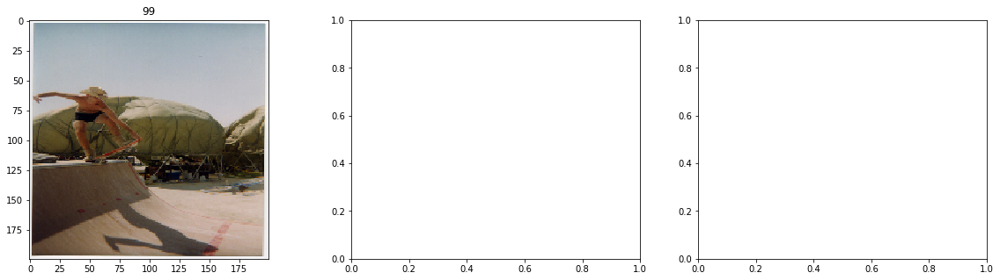

In [18]:
error=0
count=0
import pandas as pd
from copy import copy, deepcopy
from tqdm import tqdm,trange
result_df=pd.DataFrame({},columns=['class','iou','correct','True','img','boxx1','boxy1','boxx2','boxy2','conf'])
ind_loc=0
total_true_per_class={}
for _class in LABELS:
        total_true_per_class[_class]=0

if not os.path.exists('input/ground-truth'):
    os.mkdir('input/ground-truth')
if not os.path.exists('input/detection-results'):
    os.mkdir('input/detection-results')

pred_dicts=[]
for i in trange(0,1000):
  count+=1
  if test_on_test==True:
     sample=test_data[i]
     image = cv2.imread('D:/COCO/test2017/test2017/'+sample['filename'])
  if test_on_val==True:
     sample=valid_data[i]
     image = cv2.imread('D:/COCO/val2017/val2017/'+sample['filename'])
  image_h,image_w,_=image.shape
  input_image = cv2.resize(image, (IMAGE_W, IMAGE_H))
  input_image = input_image / 255.
  input_image = np.expand_dims(input_image, 0)
  netout = model.predict(input_image)
  
  if anc_box==True:
    pred_labels = decode_netout_anc(netout[0], 
                        obj_threshold=0.30,
                        nms_threshold=.90,
                        anchors=ANCHORS, 
                        nb_class=CLASS) 
  
  
   
  if anc_box==False:
    pred_labels = decode_netout_1(netout[0], 
                        obj_threshold=0.20,
                        nms_threshold=.90,
                        anchors=ANCHORS, 
                        nb_class=CLASS)
    
 
  if test_server==True:
  
      for pred_box in pred_labels:
          _x= pred_box[0]
          _y= pred_box[1]
          _width=(pred_box[2]-_x)
          _height=(pred_box[3]-_y)
          _class=list(_LABELS.keys())[int(pred_box[5])]
          pred={ 
              "image_id": int(sample['id']), 
              "category_id": int(_class), 
              "bbox": [round(_x*image_w,2),round(_y*image_h,2),round(_width*image_w,2),round(_height*image_h,2)], 
              "score": float(pred_box[4]),
          }
          true_labels=None
          pred_dicts.append(pred)
      
  if calc_map==True: 
      true_labels=sample['object']
    
      true_lb={}
      pred_lb={}
      for lbl in LABELS:
           true_lb[lbl]=[]
           pred_lb[lbl]=[]
      f=open('input/ground-truth/'+str(i)+'.txt','w')
      str_true=''
      for lbl in true_labels:
              [name,xmin,ymin,xmax,ymax]=list(lbl.values())
              true_lb[name].append([(xmin),(ymin), (xmax),(ymax)])#[cx,cy,iw,ih]
              try:name=name.split(' ')[0]+'-'+name.split(' ')[1]
              except:0
              str_true+=str(name)+' '+str(xmin)+' '+str(ymin)+' '+str(xmax)+' '+str(ymax)+'\n'
      f.write(str_true)
      f.close()

      f=open('input/detection-results/'+str(i)+'.txt','w')
      str_pred=''
      for box in pred_labels: 
              [xmin,ymin,xmax,ymax,conf,_name]=box
              name=LABELS[int(_name)]
              pred_lb[name].append([(xmin),(ymin), (xmax),(ymax),conf])#[cx,cy,iw,ih]
              try:name=name.split(' ')[0]+'-'+name.split(' ')[1]
              except:0
              str_pred+=str(name)+' '+str(conf)+' '+str(xmin)+' '+str(ymin)+' '+str(xmax)+' '+str(ymax)+'\n'
      f.write(str_pred)
      f.close()
           

      for _class in LABELS:
                for true_box in true_lb[_class]:
                    total_true_per_class[_class]+=1
                for pred_box in pred_lb[_class]:
                    _max_iou=0
                    for _ind,true_box in enumerate(true_lb[_class]):
                        _iou= IOU(true_box,pred_box[:4])
                        if _iou>=_max_iou:
                                _max_iou=_iou

                    result_df.loc[ind_loc,['class','iou','True','img','boxx1','boxy1','boxx2','boxy2','conf']]=[_class,_max_iou,1.0,i,pred_box[0],pred_box[1],pred_box[2],pred_box[3],pred_box[4]]
                    if _max_iou>=0.5:
                            result_df.loc[ind_loc,'correct']=1
                    else :
                            result_df.loc[ind_loc,'correct']=0
                    ind_loc+=1
            
       
  image = draw_boxes_1(image, pred_labels, LABELS,true_labels)
  cv2.imwrite('test_result_exp/'+str(i)+'.jpg',image)
  if i<100:
      _image=cv2.resize(image,(200,200))
      if i%3==0 :fig,axes=plt.subplots(nrows=1,ncols=3,figsize=(20,5))  
      axes[i%3].imshow(_image[:,:,::-1])
      axes[i%3].set_title(str(i))#+','+str(_ious))
      if i%3==3-1 :plt.show()
  

In [19]:
result_df.loc[:50]

,class,iou,correct,True,img,boxx1,boxy1,boxx2,boxy2,conf
0,person,0.228383,0,1,0,0.691113,0.359993,0.790077,0.651641,0.280711
1,person,0.320821,0,1,0,0.610601,0.385397,0.695974,0.601111,0.24454
2,car,0,0,1,1,0.275122,0.552237,0.412547,0.622614,0.796306
3,car,0,0,1,1,0.707054,0.570929,0.766805,0.596157,0.649788
4,car,0,0,1,1,0.515297,0.64277,0.606272,0.672529,0.625237
5,car,0,0,1,1,0.767118,0.572396,0.849777,0.592094,0.589939
6,car,0,0,1,1,0.394387,0.639701,0.463511,0.652851,0.541895
7,car,0,0,1,1,0.857325,0.559287,0.921623,0.589677,0.515002
8,car,0,0,1,1,0.287632,0.61488,0.417179,0.652297,0.471772
9,car,0,0,1,1,0.59548,0.561572,0.700134,0.595214,0.431308


In [20]:
len(pred_dicts)

0

In [21]:
f=open('_test2017_detections_yolo_results.json','w')
json.dump(pred_dicts,f)
f.close()

In [22]:
!python map.py

42.02% = airplane AP 
19.70% = bicycle AP 
52.62% = boat AP 
40.74% = bus AP 
46.69% = car AP 
43.46% = motorcycle AP 
57.57% = person AP 
57.02% = stop-sign AP 
44.45% = traffic-light AP 
52.12% = train AP 
12.18% = truck AP 
mAP = 42.60%
Figure(640x480)


In [23]:
def get_average_precision(res_class,_class):
    total_true=total_true_per_class[_class]
    #total_true=counts[_class]
    res_class['precision']=0
    res_class['recall']=0
    right=0
    for i in range(len(res_class)):
        if res_class.loc[i,'correct']==1 : right+=1
        res_class.loc[i,'precision']=right/(i+1)
        res_class.loc[i,'recall']=right/total_true
        
    AP=0
    res_class['auc']=res_class.precision.diff()
    indexes=res_class[res_class['auc']< 0.0].index.values-1
    res_class['new']=res_class.recall.diff()
    res_class['new']=res_class['new']*res_class.precision
    
    for i,ind in enumerate(indexes[:-1]):
        _precision=res_class.loc[indexes[i+1],'precision']
        delta_recall=abs(res_class.loc[indexes[i+1],'recall']-res_class.loc[indexes[i],'recall'])
        AP+=_precision*delta_recall
    return (AP),res_class


In [24]:
counts=result_df['class'].value_counts()
res_grp=result_df.groupby('class')
mAP=0
log_dfs={}
APS={}
for label in LABELS:
  #try:
    res_class=res_grp.get_group(label).reset_index(drop=True)
    res_class=res_class.sort_values(by='conf',ascending=False).reset_index(drop=True)
    AP,log_df=get_average_precision(res_class,label)
    mAP+=AP*counts[label]
    print(label,AP,counts[label])
    log_dfs[label]=log_df
    APS[label]=AP
  #except:0
mAP=mAP/counts.sum()
APS['mAP']=mAP
print('mAP:',mAP)

person 0.20393214415107258 2934
bicycle 0.06668871908146566 23
car 0.10617659171481639 613
motorcycle 0.12481583188709072 79
airplane 0.3032682662315571 64
bus 0.24259228104206726 57
train 0.08727272727272725 30
truck 0.07515370597513785 36
boat 0.02695727120629907 189
traffic light 0.03064693102608605 175
stop sign 0.08984582668793195 12
mAP: 0.17210692885035575


In [25]:
0.1
person 0.20616612794312725 3551
bicycle 0.06668871908146566 37
car 0.10931145260489315 898
motorcycle 0.14914587329204815 106
airplane 0.30760679833430044 94
bus 0.263683968939368 69
train 0.21708081125264492 42
truck 0.09038337479513948 61
boat 0.02667819507724144 290
traffic light 0.03064693102608605 243
stop sign 0.08984582668793195 14
mAP: 0.1714553719076661

SyntaxError: invalid syntax (<ipython-input-25-ba3cef813450>, line 2)

In [ ]:
import pickle
f=open(root+exp_name+'mAP','wb')
pickle.dump(APS,f)
f.close()
AP_df=pd.DataFrame(APS,index=[0]).transpose()
AP_df.plot.bar()

In [ ]:
for key in log_dfs.keys():
    log_df=log_dfs[key]
    plt.plot(log_df.recall,log_df.precision)
    plt.title(key+' recall vs precision')
    plt.savefig(root+exp_name+'prec_recall.png')
    plt.show()

In [ ]:
log_dfs['person'].tail(50)#.correct.sum()/total_true_per_class['person']#len(log_dfs['person'])

In [ ]:
#model.save(root+exp_name+'70.h5')

In [ ]:
print(

### Extra Debug

In [ ]:
GRID_W=7
GRID_H=7
BATCH_SIZE=10
cell_x = tf.to_float(tf.reshape(tf.tile(tf.range(GRID_W), [GRID_H]), (1, GRID_H, GRID_W, 1, 1)))
cell_y = tf.transpose(cell_x, (0,2,1,3,4))
cell_grid = tf.tile(tf.concat([cell_x,cell_y], -1), [BATCH_SIZE, 1, 1, 5, 1])

#pred_xy = tf.sigmoid(y_pred[..., :2]) + cell_grid
#pred_wh = tf.exp(y_pred[..., 2:4]) * np.reshape(ANCHORS, [1,1,1,BOX,2])
sess=tf.Session()
x,y,grid=sess.run([cell_x,cell_y,cell_grid])

In [ ]:
x.shape,y.shape,grid.shape

In [ ]:
z=np.concatenate([x,y],-1)
z.shape

In [ ]:
y_true=np.ones((7,7,10))
ob_mask= tf.expand_dims(y_true[..., 4], axis=-1)
sess=tf.Session()
_mask=sess.run(ob_mask)
_mask.shape,y_true[..., 4].shape

In [ ]:
import numpy as np
import tensorflow as tf
label=np.ones((7,7,15))
label[...,14]=5
true_box=np.argmax(label[...,10:],-1)

In [ ]:
wts=np.ones((10))
wts[3:7]=9
res=tf.gather(wts,true_box)
sess=tf.Session()
ret=sess.run(res)
ret

In [ ]:
ret.shape,label[...,4:].shape,label[...,5:].shape

In [ ]:
import tensorflow as tf
X=tf.zeros((3,3))
Y=tf.equal(X,1)
A=tf.where(Y,X,tf.ones_like(X))
sess=tf.Session()
Z=sess.run(A)
Z 

### Extra functions

In [ ]:
import csv

def read_data(dataset):
  f=open(dataset+'/label.csv')
  file=csv.reader(f,delimiter=',')
  data=[]
  i=0
    
  sc=416.0
  for line in file:
      dt=line
      H=dt[0]
      W=dt[1]
      xmin=(float(dt[2]))/sc
      ymin=(float(dt[3]))/sc
      xmax=(float(dt[4]))/sc
      ymax=(float(dt[5]))/sc

      output={
          'filename':dataset+'/images/'+str(i)+'.jpg',
          'height':H,
          'width':W,
          'object':[{'name':'None',
          'xmin':xmin*IMAGE_W,
          'ymin':ymin*IMAGE_H,
          'xmax':xmax*IMAGE_W,
          'ymax':ymax*IMAGE_H}]
          }

      data.append(output)
      i=i+1
  return data
